In [ ]:
! git clone https://github.com/soujanyasyamal/sensorfusion.git

In [1]:
!unzip 'kitti_dataset.zip'

Archive:  kitti_dataset.zip
   creating: kitti_dataset/
   creating: kitti_dataset/calib/
   creating: kitti_dataset/velodyne_pcd/
   creating: kitti_dataset/images/
   creating: kitti_dataset/label/
   creating: kitti_dataset/velodyne_bin/
  inflating: kitti_dataset/calib/000025.txt  
  inflating: kitti_dataset/calib/000021.txt  
  inflating: kitti_dataset/calib/000008.txt  
  inflating: kitti_dataset/calib/000011.txt  
  inflating: kitti_dataset/calib/000010.txt  
  inflating: kitti_dataset/calib/000000.txt  
  inflating: kitti_dataset/calib/000015.txt  
  inflating: kitti_dataset/calib/000016.txt  
  inflating: kitti_dataset/velodyne_pcd/000015.pcd  
  inflating: kitti_dataset/velodyne_pcd/000000.pcd  
  inflating: kitti_dataset/velodyne_pcd/000016.pcd  
  inflating: kitti_dataset/velodyne_pcd/000010.pcd  
  inflating: kitti_dataset/velodyne_pcd/000011.pcd  
  inflating: kitti_dataset/velodyne_pcd/000008.pcd  
  inflating: kitti_dataset/velodyne_pcd/000021.pcd  
  inflating: kitti_d

In [3]:
!pip install open3d==0.16.0 # Version 12

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.5/422.5 MB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 123.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 25.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 88.1 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 2.3.6
    Uninstalling Werkzeug-2.3.6:
      Successfully uninstalled Werkzeug-2.3.6
  Attempting uninstall: nbformat
    Found existing installation: nbformat 5.9.1
    Uninstalling nbformat-5.9.1:
      Successfully uninstalled nbformat-5.9.1


In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import Image
import glob
import open3d as o3d

In [6]:
image_files = sorted(glob.glob("/content/kitti_dataset/images/*.png"))
point_files = sorted(glob.glob("/content/kitti_dataset/velodyne_pcd/*.pcd"))
label_files = sorted(glob.glob("/content/kitti_dataset/label/*.txt"))
calib_files = sorted(glob.glob("/content/kitti_dataset/calib/*.txt"))

index = 0
pcd_file = point_files[index]
image = cv2.cvtColor(cv2.imread(image_files[index]), cv2.COLOR_BGR2RGB)
cloud = o3d.io.read_point_cloud(pcd_file)
points= np.asarray(cloud.points)

Text(0.5, 1.0, 'Image')

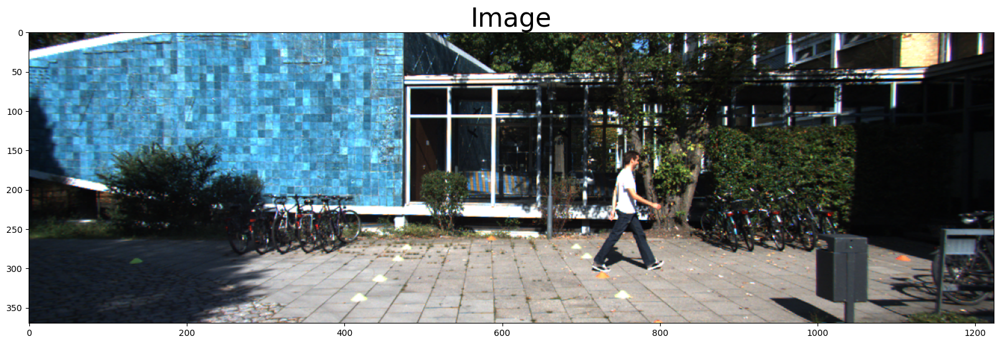

In [7]:
f, (ax1) = plt.subplots(1, 1, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Image', fontsize=30)

In [8]:
!pip install pypotree

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.7/147.7 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pypotree: filename=pypotree-1.0.5-py3-none-any.whl size=10299113 sha256=9194c86c40ecd994e8553dc4c548154e9f599ca0db5cd92dd90053d1eb6daefe
  Stored in directory: /root/.cache/pip/wheels/61/53/c5/9fa90014fa2b468849fcebd5b3bb71f8eda71229e9953a6c5b
Successfully built pypotree


In [9]:
import pypotree
cloudpath = pypotree.generate_cloud_for_display(points)
pypotree.display_cloud_colab(cloudpath)

/usr/local/lib/python3.10/dist-packages/bin/PotreeConverter .tmp.txt -f xyz -o point_clouds -p f2e35c --material ELEVATION --edl-enabled --overwrite
server on port 38349: thread <Thread(Thread-11 (server_entry), started 139380194793024)> 
https://localhost:38349/point_clouds/pointclouds/f2e35c


In [10]:
class LiDAR2Camera(object):
    def __init__(self, calib_file):
        calibs = self.read_calib_file(calib_file)
        P = calibs["P2"]
        self.P = np.reshape(P, [3, 4])
        # Rigid transform from Velodyne coord to reference camera coord
        V2C = calibs["Tr_velo_to_cam"]
        self.V2C = np.reshape(V2C, [3, 4])
        # Rotation from reference camera coord to rect camera coord
        R0 = calibs["R0_rect"]
        self.R0 = np.reshape(R0, [3, 3])

    def read_calib_file(self, filepath):
        """ Read in a calibration file and parse into a dictionary.
        Ref: https://github.com/utiasSTARS/pykitti/blob/master/pykitti/utils.py
        """
        data = {}
        with open(filepath, "r") as f:
            for line in f.readlines():
                line = line.rstrip()
                if len(line) == 0:
                    continue
                key, value = line.split(":", 1)
                # The only non-float values in these files are dates, which
                # we don't care about anyway
                try:
                    data[key] = np.array([float(x) for x in value.split()])
                except ValueError:
                    pass
        return data

In [12]:
lidar2cam = LiDAR2Camera(calib_files[index])
print("P :"+str(lidar2cam.P))
print("-")
print("RO "+str(lidar2cam.R0))
print("-")
print("Velo 2 Cam " +str(lidar2cam.V2C))
print("-")
#print("Cam 2 Velo" + str(lidar2cam.C2V))

P :[[ 7.070493e+02  0.000000e+00  6.040814e+02  4.575831e+01]
 [ 0.000000e+00  7.070493e+02  1.805066e+02 -3.454157e-01]
 [ 0.000000e+00  0.000000e+00  1.000000e+00  4.981016e-03]]
-
RO [[ 0.9999128   0.01009263 -0.00851193]
 [-0.01012729  0.9999406  -0.00403767]
 [ 0.00847068  0.00412352  0.9999556 ]]
-
Velo 2 Cam [[ 0.00692796 -0.9999722  -0.00275783 -0.02457729]
 [-0.00116298  0.00274984 -0.9999955  -0.06127237]
 [ 0.9999753   0.00693114 -0.0011439  -0.3321029 ]]
-


In [13]:
def cart2hom(self, pts_3d):
    """ Input: nx3 points in Cartesian
        Oupput: nx4 points in Homogeneous by pending 1
    """
    n = pts_3d.shape[0]
    pts_3d_hom = np.hstack((pts_3d, np.ones((n, 1))))
    return pts_3d_hom

LiDAR2Camera.cart2hom = cart2hom

In [14]:
def project_velo_to_image(self, pts_3d_velo):
    '''
    Input: 3D points in Velodyne Frame [nx3]
    Output: 2D Pixels in Image Frame [nx2]
    '''
    # REVERSE TECHNIQUE
    '''
    homogeneous = self.cart2hom(pts_3d_velo)  # nx4
    dotted_RT = np.dot(homogeneous, np.transpose(self.V2C)) #nx3
    dotted_with_RO = np.transpose(np.dot(self.R0, np.transpose(dotted_RT))) #nx3
    homogeneous_2 = self.cart2hom(dotted_with_RO) #nx4
    pts_2d = np.dot(homogeneous_2, np.transpose(self.P))  # nx3
    '''

    # NORMAL TECHNIQUE
    R0_homo = np.vstack([self.R0, [0, 0, 0]])
    R0_homo_2 = np.column_stack([R0_homo, [0, 0, 0, 1]])
    p_r0 = np.dot(self.P, R0_homo_2) #PxR0
    p_r0_rt =  np.dot(p_r0, np.vstack((self.V2C, [0, 0, 0, 1]))) #PxROxRT
    pts_3d_homo = np.column_stack([pts_3d_velo, np.ones((pts_3d_velo.shape[0],1))])
    p_r0_rt_x = np.dot(p_r0_rt, np.transpose(pts_3d_homo))#PxROxRTxX
    pts_2d = np.transpose(p_r0_rt_x)

    pts_2d[:, 0] /= pts_2d[:, 2]
    pts_2d[:, 1] /= pts_2d[:, 2]
    return pts_2d[:, 0:2]

LiDAR2Camera.project_velo_to_image = project_velo_to_image
print(points[:5,:3])
print("Euclidean Pixels "+str(lidar2cam.project_velo_to_image(points[:5,:3])))

[[1.83239994e+01 4.89999987e-02 8.28999996e-01]
 [1.83439999e+01 1.05999999e-01 8.28999996e-01]
 [5.12989998e+01 5.04999995e-01 1.94400001e+00]
 [1.83169994e+01 2.21000001e-01 8.28999996e-01]
 [1.83519993e+01 2.50999987e-01 8.29999983e-01]]
Euclidean Pixels [[602.0853193  141.7459889 ]
 [599.8489135  141.81345282]
 [596.12144246 149.02292823]
 [595.32342031 141.81867067]
 [594.16066125 141.86235751]]


In [15]:
def get_lidar_in_image_fov(self,pc_velo, xmin, ymin, xmax, ymax, return_more=False, clip_distance=2.0):
    """ Filter lidar points, keep those in image FOV """
    pts_2d = self.project_velo_to_image(pc_velo)
    fov_inds = (
        (pts_2d[:, 0] < xmax)
        & (pts_2d[:, 0] >= xmin)
        & (pts_2d[:, 1] < ymax)
        & (pts_2d[:, 1] >= ymin)
    )
    fov_inds = fov_inds & (pc_velo[:, 0] > clip_distance) # We don't want things that are closer to the clip distance (2m)
    imgfov_pc_velo = pc_velo[fov_inds, :]
    if return_more:
        return imgfov_pc_velo, pts_2d, fov_inds
    else:
        return imgfov_pc_velo

LiDAR2Camera.get_lidar_in_image_fov = get_lidar_in_image_fov

In [17]:
def show_lidar_on_image(self, pc_velo, img, debug="False"):
    """ Project LiDAR points to image """
    imgfov_pc_velo, pts_2d, fov_inds = self.get_lidar_in_image_fov(
        pc_velo, 0, 0, img.shape[1], img.shape[0], True
    )
    if (debug==True):
        print("3D PC Velo "+ str(imgfov_pc_velo)) # The 3D point Cloud Coordinates
        print("2D PIXEL: " + str(pts_2d)) # The 2D Pixels
        print("FOV : "+str(fov_inds)) # Whether the Pixel is in the image or not
    self.imgfov_pts_2d = pts_2d[fov_inds, :]
    '''
    #homogeneous = np.hstack((imgfov_pc_velo, np.ones((imgfov_pc_velo.shape[0], 1))))
    homogeneous = self.cart2hom(imgfov_pc_velo)
    transposed_RT = np.dot(homogeneous, np.transpose(self.V2C))
    dotted_RO = np.transpose(np.dot(self.R0, np.transpose(transposed_RT)))
    self.imgfov_pc_rect = dotted_RO

    if debug==True:
        print("FOV PC Rect "+ str(self.imgfov_pc_rect))
    '''
    cmap = plt.cm.get_cmap("hsv", 256)
    cmap = np.array([cmap(i) for i in range(256)])[:, :3] * 255
    self.imgfov_pc_velo = imgfov_pc_velo

    for i in range(self.imgfov_pts_2d.shape[0]):
        #depth = self.imgfov_pc_rect[i,2]
        #print(depth)
        depth = imgfov_pc_velo[i,0]
        print(depth)
        color = cmap[int(510.0 / depth), :]
        cv2.circle(
            img,(int(np.round(self.imgfov_pts_2d[i, 0])), int(np.round(self.imgfov_pts_2d[i, 1]))),2,
            color=tuple(color),
            thickness=-1,
        )

    return img

LiDAR2Camera.show_lidar_on_image = show_lidar_on_image

<ipython-input-17-d0e0ba3556a2>:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("hsv", 256)


Streaming output truncated to the last 5000 lines.
6.60699987411499
6.568999767303467
6.559000015258789
6.565999984741211
6.552999973297119
6.578000068664551
6.591000080108643
6.61299991607666
6.6539998054504395
6.554999828338623
7.23799991607666
8.331999778747559
8.362000465393066
8.359999656677246
8.37600040435791
5.5980000495910645
5.625
6.609000205993652
8.446999549865723
8.461999893188477
8.472999572753906
8.484999656677246
8.493000030517578
8.517000198364258
8.531999588012695
8.53600025177002
8.557999610900879
8.560999870300293
8.562999725341797
8.586000442504883
8.61400032043457
8.62600040435791
8.628999710083008
8.645000457763672
8.638999938964844
8.659000396728516
8.680999755859375
8.696000099182129
8.715999603271484
8.734000205993652
8.73799991607666
8.75
8.770000457763672
8.772000312805176
8.795999526977539
5.551000118255615
5.558000087738037
5.553999900817871
5.551000118255615
5.546999931335449
5.552999973297119
5.547999858856201
5.544000148773193
5.541999816894531
5.548999

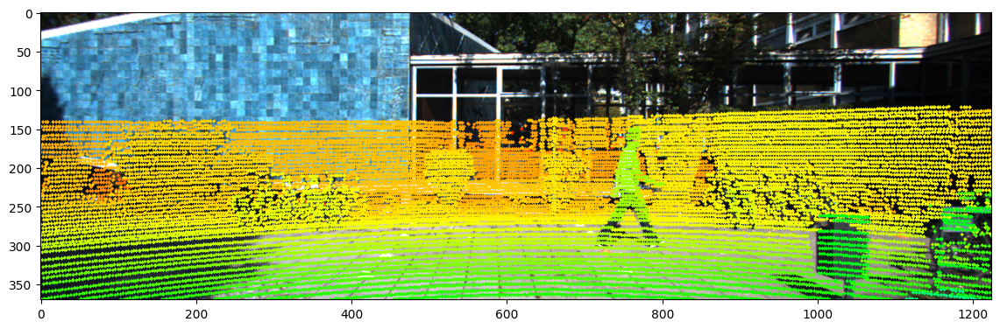

In [18]:
#img_3 = lidar2cam.show_lidar_on_image(points[:,:3], image)
img_3 = image.copy()
img_3 = lidar2cam.show_lidar_on_image(points[:,:3], img_3)
plt.figure(figsize=(14,7))
plt.imshow(img_3)
plt.show()

In [19]:
!python3 -m pip install yolov4==2.0.2

  Preparing metadata (setup.py) ... done
  Created wheel for yolov4: filename=yolov4-2.0.2-py3-none-any.whl size=39742 sha256=e35245a8a988710273721ef2c01deab8faf37d2622f4fd550647409cbf99eb22
  Stored in directory: /root/.cache/pip/wheels/55/32/e0/b3cc98a6ab4a0a583ce2572baf44ef09172ed74e61dbfddc26
Successfully built yolov4


In [21]:
from yolov4.tf import YOLOv4
import tensorflow as tf

! mkdir yolov4_contents
! gdown --id 1GJwGiR7rizY_19c_czuLN8p31BwkhWY5 -O /content/yolov4_contents/yolov4-tiny.weights
! gdown --id 15P4cYyZ2Sd876HKAEWSmeRdFl_j-0upi -O /content/yolov4_contents/yolov4.weights
! wget https://raw.githubusercontent.com/AlexeyAB/darknet/master/data/coco.names -P /content/yolov4_contents

yolo = YOLOv4()
# yolo = YOLOv4(tiny=True) # for tiny yolo
yolo.classes = "/content/yolov4_contents/coco.names"
yolo.make_model()
# Yolov4 trained on COCO dataset
yolo.load_weights("/content/yolov4_contents/yolov4.weights",
                  weights_type="yolo")
# Using Yolov4 trained on COCO dataset
# yolo.load_weights("/content/yolov4_contents/yolov4-tiny.weights",
#                   weights_type="yolo")


/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1GJwGiR7rizY_19c_czuLN8p31BwkhWY5
To: /content/yolov4_contents/yolov4-tiny.weights
100% 24.3M/24.3M [00:00<00:00, 71.9MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=15P4cYyZ2Sd876HKAEWSmeRdFl_j-0upi
To: /content/yolov4_contents/yolov4.weights
100% 258M/258M [00:04<00:00, 51.6MB/s]
--2023-07-29 11:33:14--  https://raw.githubusercontent.com/AlexeyAB/darknet/master/data/coco.names
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Co

1/1 [==============================] - 5s 5s/step


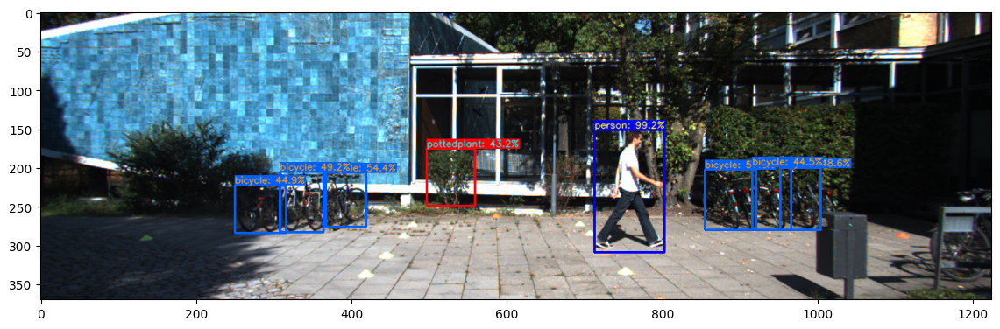

In [22]:
def run_obstacle_detection(img):
    start_time=time.time()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    resized_image = yolo.resize_image(img)
    # 0 ~ 255 to 0.0 ~ 1.0
    resized_image = resized_image / 255.
    #input_data == Dim(1, input_size, input_size, channels)
    input_data = resized_image[np.newaxis, ...].astype(np.float32)

    candidates = yolo.model.predict(input_data)

    _candidates = []
    result = img.copy()
    for candidate in candidates:
        batch_size = candidate.shape[0]
        grid_size = candidate.shape[1]
        _candidates.append(tf.reshape(candidate, shape=(1, grid_size * grid_size * 3, -1)))
        #candidates == Dim(batch, candidates, (bbox))
        candidates = np.concatenate(_candidates, axis=1)
        #pred_bboxes == Dim(candidates, (x, y, w, h, class_id, prob))
        pred_bboxes = yolo.candidates_to_pred_bboxes(candidates[0], iou_threshold=0.35, score_threshold=0.40)
        pred_bboxes = pred_bboxes[~(pred_bboxes==0).all(1)] #https://stackoverflow.com/questions/35673095/python-how-to-eliminate-all-the-zero-rows-from-a-matrix-in-numpy?lq=1
        pred_bboxes = yolo.fit_pred_bboxes_to_original(pred_bboxes, img.shape)
        exec_time = time.time() - start_time
        #print("time: {:.2f} ms".format(exec_time * 1000))
        result = yolo.draw_bboxes(img, pred_bboxes)
        result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    return result, pred_bboxes

result, pred_bboxes = run_obstacle_detection(image)

fig_camera = plt.figure(figsize=(14, 7))
ax_lidar = fig_camera.subplots()
ax_lidar.imshow(result)
plt.show()

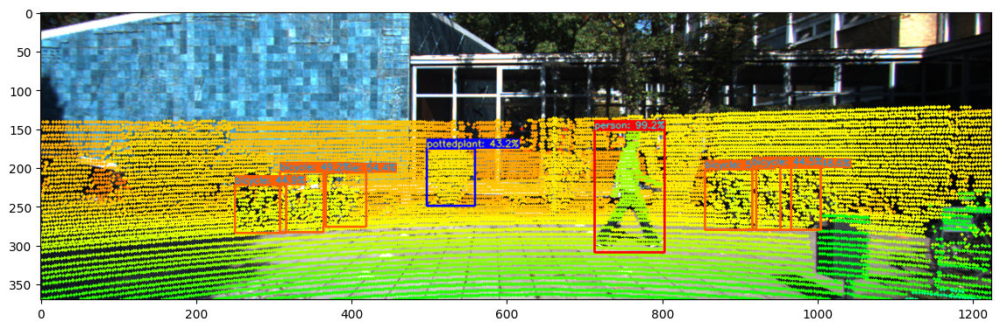

False

In [23]:
lidar_img_with_bboxes= yolo.draw_bboxes(img_3, pred_bboxes)
fig_fusion = plt.figure(figsize=(14, 7))
ax_fusion = fig_fusion.subplots()
ax_fusion.imshow(lidar_img_with_bboxes)
plt.show()
cv2.imwrite("output/lidar_bboxes.png", lidar_img_with_bboxes)

In [24]:
print(pred_bboxes)

[[6.20088995e-01 6.22532900e-01 7.35726207e-02 4.31488069e-01
  0.00000000e+00 9.92375851e-01]
 [7.26201236e-01 6.51728939e-01 5.43494336e-02 2.12049129e-01
  1.00000000e+00 5.76435387e-01]
 [3.21644574e-01 6.53111161e-01 4.40946817e-02 1.89205729e-01
  1.00000000e+00 5.43920100e-01]
 [2.74791241e-01 6.61850117e-01 4.66551594e-02 2.15192674e-01
  1.00000000e+00 4.91851985e-01]
 [7.99504817e-01 6.50686653e-01 4.37514484e-02 2.17426806e-01
  1.00000000e+00 4.85686600e-01]
 [2.31403455e-01 6.84890832e-01 5.54547571e-02 1.72882975e-01
  1.00000000e+00 4.49075609e-01]
 [7.69040942e-01 6.46085096e-01 4.23074737e-02 2.24502289e-01
  1.00000000e+00 4.44524169e-01]
 [4.31739956e-01 5.73277881e-01 5.15825711e-02 2.01607166e-01
  5.80000000e+01 4.31895792e-01]]


In [25]:
def rectContains(rect,pt, w, h, shrink_factor = 0):
    x1 = int(rect[0]*w - rect[2]*w*0.5*(1-shrink_factor)) # center_x - width /2 * shrink_factor
    y1 = int(rect[1]*h-rect[3]*h*0.5*(1-shrink_factor)) # center_y - height /2 * shrink_factor
    x2 = int(rect[0]*w + rect[2]*w*0.5*(1-shrink_factor)) # center_x + width/2 * shrink_factor
    y2 = int(rect[1]*h+rect[3]*h*0.5*(1-shrink_factor)) # center_y + height/2 * shrink_factor

    return x1 < pt[0]<x2 and y1 <pt[1]<y2

In [26]:
import statistics
import random

def filter_outliers(distances):
    inliers = []
    mu  = statistics.mean(distances)
    std = statistics.stdev(distances)
    for x in distances:
        if abs(x-mu) < std:
            # This is an INLIER
            inliers.append(x)
    return inliers

def get_best_distance(distances, technique="closest"):
    if technique == "closest":
        return min(distances)
    elif technique =="average":
        return statistics.mean(distances)
    elif technique == "random":
        return random.choice(distances)
    else:
        return statistics.median(sorted(distances))

In [27]:
def lidar_camera_fusion(self, pred_bboxes, image):
    img_bis = image.copy()

    cmap = plt.cm.get_cmap("hsv", 256)
    cmap = np.array([cmap(i) for i in range(256)])[:, :3] * 255
    distances = []
    for box in pred_bboxes:
        distances = []
        for i in range(self.imgfov_pts_2d.shape[0]):
            #depth = self.imgfov_pc_rect[i, 2]
            depth = self.imgfov_pc_velo[i,0]
            if (rectContains(box, self.imgfov_pts_2d[i], image.shape[1], image.shape[0], shrink_factor=0.2)==True):
                distances.append(depth)

                color = cmap[int(510.0 / depth), :]
                cv2.circle(img_bis,(int(np.round(self.imgfov_pts_2d[i, 0])), int(np.round(self.imgfov_pts_2d[i, 1]))),2,color=tuple(color),thickness=-1,)
        h, w, _ = img_bis.shape
        if (len(distances)>2):
            distances = filter_outliers(distances)
            best_distance = get_best_distance(distances, technique="average")
            cv2.putText(img_bis, '{0:.2f} m'.format(best_distance), (int(box[0]*w),int(box[1]*h)), cv2.FONT_HERSHEY_SIMPLEX, 0.75, (255, 0, 0), 3, cv2.LINE_AA)
        distances_to_keep = []

    return img_bis, distances

LiDAR2Camera.lidar_camera_fusion = lidar_camera_fusion

<ipython-input-27-7d9a40dd019e>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("hsv", 256)


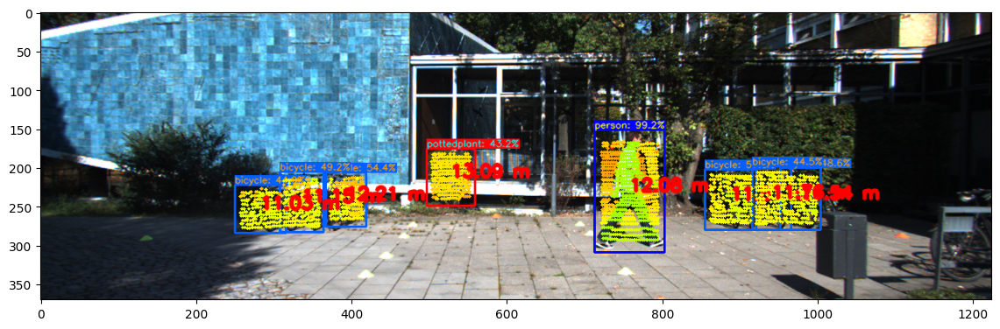

In [28]:
final_result, _ = lidar2cam.lidar_camera_fusion(pred_bboxes, result)

fig_keeping = plt.figure(figsize=(14, 7))
ax_keeping = fig_keeping.subplots()
ax_keeping.imshow(final_result)
plt.show()

In [29]:
def pipeline (self, image, point_cloud):
    "For a pair of 2 Calibrated Images"
    img = image.copy()
    # Show LidAR on Image
    lidar_img = self.show_lidar_on_image(point_cloud[:,:3], image)
    # Run obstacle detection in 2D
    result, pred_bboxes = run_obstacle_detection(img)
    # Fuse Point Clouds & Bounding Boxes
    img_final, _ = self.lidar_camera_fusion(pred_bboxes, result)
    return img_final

LiDAR2Camera.pipeline = pipeline

<ipython-input-17-d0e0ba3556a2>:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("hsv", 256)


Streaming output truncated to the last 5000 lines.
6.559000015258789
6.565999984741211
6.552999973297119
6.578000068664551
6.591000080108643
6.61299991607666
6.6539998054504395
6.554999828338623
7.23799991607666
8.331999778747559
8.362000465393066
8.359999656677246
8.37600040435791
5.5980000495910645
5.625
6.609000205993652
8.446999549865723
8.461999893188477
8.472999572753906
8.484999656677246
8.493000030517578
8.517000198364258
8.531999588012695
8.53600025177002
8.557999610900879
8.560999870300293
8.562999725341797
8.586000442504883
8.61400032043457
8.62600040435791
8.628999710083008
8.645000457763672
8.638999938964844
8.659000396728516
8.680999755859375
8.696000099182129
8.715999603271484
8.734000205993652
8.73799991607666
8.75
8.770000457763672
8.772000312805176
8.795999526977539
5.551000118255615
5.558000087738037
5.553999900817871
5.551000118255615
5.546999931335449
5.552999973297119
5.547999858856201
5.544000148773193
5.541999816894531
5.548999786376953
5.538000106811523
5.53999

<ipython-input-27-7d9a40dd019e>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("hsv", 256)


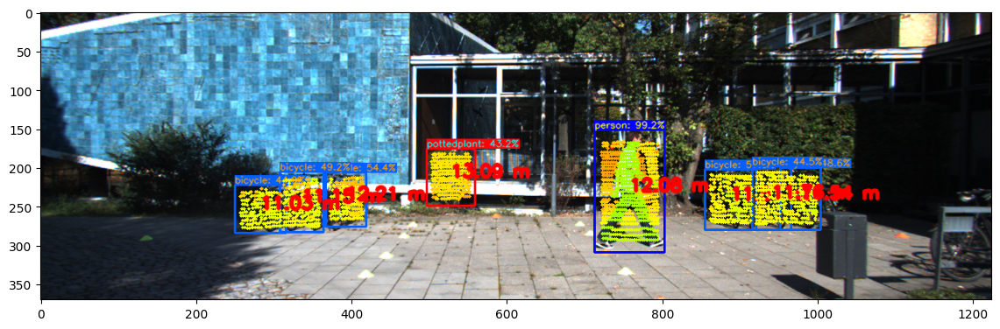

In [30]:
image_files = sorted(glob.glob("/content/kitti_dataset/images/*.png"))
point_files = sorted(glob.glob("/content/kitti_dataset/velodyne_pcd/*.pcd"))
label_files = sorted(glob.glob("/content/kitti_dataset/label/*.txt"))
calib_files = sorted(glob.glob("/content/kitti_dataset/calib/*.txt"))

lidar2cam = LiDAR2Camera(calib_files[index])
cloud = o3d.io.read_point_cloud(pcd_file)
points= np.asarray(cloud.points)

index = 0
image = cv2.cvtColor(cv2.imread(image_files[index]), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14,7))
final_result = lidar2cam.pipeline(image.copy(), points)
plt.imshow(final_result)
plt.show()

Text(0.5, 1.0, 'Prediction')

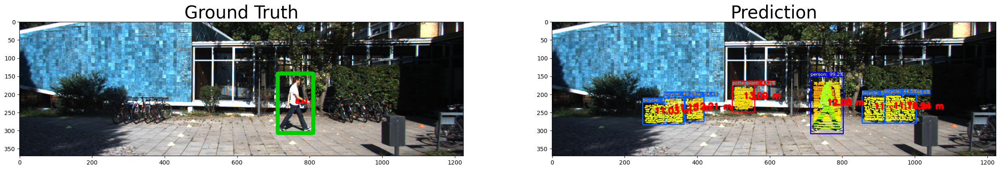

In [31]:
image_gt = image.copy()

with open(label_files[index], 'r') as f:
    fin = f.readlines()
    for line in fin:
        if line.split(" ")[0] != "DontCare":
            #print(line)
            x1_value = int(float(line.split(" ")[4]))
            y1_value = int(float(line.split(" ")[5]))
            x2_value = int(float(line.split(" ")[6]))
            y2_value = int(float(line.split(" ")[7]))
            dist = float(line.split(" ")[13])
            cv2.rectangle(image_gt, (x1_value, y1_value), (x2_value, y2_value), (0,205,0), 10)
            cv2.putText(image_gt, str(dist), (int((x1_value+x2_value)/2),int((y1_value+y2_value)/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2, cv2.LINE_AA)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,20))
ax1.imshow(image_gt)
ax1.set_title('Ground Truth', fontsize=30)
ax2.imshow(final_result) # or flag
ax2.set_title('Prediction', fontsize=30)

In [ ]:
video_images = sorted(glob.glob("data/video 4/images/*.png"))
video_points = sorted(glob.glob("data/video 4/points/*.pcd"))

# Build a LiDAR2Cam object
lidar2cam_video = LiDAR2Camera(calib_files[0])

result_video = []

for idx, img in enumerate(video_images):
    image = cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB)
    point_cloud = np.asarray(o3d.io.read_point_cloud(video_points[idx]).points)
    result_video.append(lidar2cam_video.pipeline(image, point_cloud))

#out = cv2.VideoWriter('output/out.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, (image.shape[1],image.shape[0]))
out = cv2.VideoWriter('output/out_4.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 15, (image.shape[1],image.shape[0]))

for i in range(len(result_video)):
    out.write(cv2.cvtColor(result_video[i], cv2.COLOR_BGR2RGB))
    #out.write(result_video[i])
out.release()